### Experiment - 4: Frequency Domain Filtering
**Author:** Irsh Vijay | 21EC39055

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from fft_utils import FFT
from PIL import Image

class Experiment4(FFT):
    def __init__(self):
        pass

    def low_pass(self, filepath: str, cutoff: int, _type = "ideal", verbose = False):
      self.load_image(filepath)

      fft = self.fft_2d(self.img)
      fft = self.fftshift(fft)
      if verbose:
        self.visualize_spectrum(fft, shift=False, title="Original FFT")

      rows, cols = len(fft), len(fft[0])
      center_x, center_y = rows // 2, cols // 2
      op = np.zeros_like(fft)

      if _type == "ideal":
        for i in range(rows):
          for j in range(cols):
            distance = np.sqrt((i - center_x) ** 2 + (j - center_y) ** 2)
            if distance <= cutoff:
              op[i][j] = fft[i][j]

      elif _type == "gaussian":
        for i in range(rows):
          for j in range(cols):
            distance = np.sqrt((i - center_x) ** 2 + (j - center_y) ** 2)
            op[i][j] = fft[i][j] * np.exp(-(distance**2) / (2 * cutoff**2))

      elif _type == "butter":
        order = 3

        for i in range(rows):
          for j in range(cols):
            distance = np.sqrt((i - center_x) ** 2 + (j - center_y) ** 2)
            op[i][j] = fft[i][j] * 1 / (1 + (distance/cutoff)**(2 * order))
      else:
        raise NotImplementedError

      op = self.fftshift(op)
      if verbose:
        self.visualize_spectrum(op, shift=True, title="Filtered FFT")
      new_op = np.real(self.ifft_2d(op))
      if verbose:
        plt.show()

      return new_op[:self.img.shape[0], :self.img.shape[1]]

    def high_pass(self, filepath: str, cutoff: int, _type = "ideal", verbose=False):
      self.load_image(filepath)

      fft = self.fft_2d(self.img)
      fft = self.fftshift(fft)
      if verbose:
        self.visualize_spectrum(fft, shift=False, title="Original FFT")

      rows, cols = len(fft), len(fft[0])
      center_x, center_y = rows // 2, cols // 2
      op = np.zeros_like(fft)

      if _type == "ideal":
        for i in range(rows):
          for j in range(cols):
            distance = np.sqrt((i - center_x) ** 2 + (j - center_y) ** 2)
            if distance >= cutoff:
              op[i][j] = fft[i][j]

      elif _type == "gaussian":
        for i in range(rows):
          for j in range(cols):
            distance = np.sqrt((i - center_x) ** 2 + (j - center_y) ** 2)
            op[i][j] = fft[i][j] * (1 - np.exp(-(distance**2) / (2 * cutoff**2)))

      elif _type == "butter":
        order = 3

        for i in range(rows):
          for j in range(cols):
            distance = np.sqrt((i - center_x) ** 2 + (j - center_y) ** 2)
            op[i][j] = fft[i][j] * 1 / (1 + (cutoff/distance)**(2 * order))
      else:
        raise NotImplementedError

      op = self.fftshift(op)
      if verbose:
        self.visualize_spectrum(op, shift=True, title="Filtered FFT")
      new_op = np.real(self.ifft_2d(op))
      if verbose:
        plt.show()

      return new_op[:self.img.shape[0], :self.img.shape[1]]

    def downscale(self, filepath: str, factor: int):
      img = self.low_pass(filepath, 15, "gaussian")
      img = (img[::factor].T)[::factor].T
      plt.subplot(1, 2, 1)
      plt.title('Original Image')
      plt.imshow(self.img, cmap='gray')
      plt.axis('off')
      plt.subplot(1, 2, 2)
      plt.title('Downscaled Image')
      plt.imshow(img[:self.img.shape[0] // factor, :self.img.shape[1] // factor], cmap='gray')
      plt.axis('off')
      plt.show()
    
    def upscale(self, filepath: str, factor: int):
      img = self.high_pass(filepath, 15, "gaussian")

      img = np.repeat(np.repeat(img, factor, axis=0), factor, axis=1)

      plt.subplot(1, 2, 1)
      plt.title('Original Image')
      plt.imshow(self.img, cmap='gray')
      plt.axis('off')
      plt.subplot(1, 2, 2)
      plt.title('Upscaled Image')
      plt.imshow(img[:self.img.shape[0] * factor, :self.img.shape[1] * factor], cmap='gray')
      plt.axis('off')
      plt.show()

    def hybridize_image(self, filepath1: str, filepath2: str, cutoff=30):
      hpf = self.high_pass(filepath=filepath1, cutoff=cutoff, _type="gaussian")
      lpf = self.low_pass(filepath=filepath2, cutoff=cutoff, _type="gaussian")

      hybrid = hpf+lpf

      plt.figure(figsize=(12, 6))

      self.load_image(filepath1)
      plt.subplot(1, 3, 1)
      plt.imshow(hpf, cmap='gray')
      plt.title('High Frequency Image')
      plt.axis('off')

      self.load_image(filepath2)
      plt.subplot(1, 3, 2)
      plt.imshow(lpf, cmap='gray')
      plt.title('Low Frequency Image')
      plt.axis('off')

      plt.subplot(1, 3, 3)
      plt.imshow(hybrid, cmap='gray')
      plt.title('Hybrid Image')
      plt.axis('off')

      plt.show()
      
      return hybrid
    
    def grating(self, filepath: str, wavelength: int, angle=0, phase=0, verbose=False):
      self.load_image(filepath)
      img = self.img
      h, w = img.shape
      x, y = np.meshgrid(np.arange(h), np.arange(w))

      gradient = - np.sin(angle * np.pi / 180) * x - np.cos(angle * np.pi / 180) * y

      grating = np.sin((2 * np.pi * gradient) / wavelength + (phase * np.pi) / 180)
      
      if verbose:
        plt.imshow(grating, cmap="gray")
        plt.axis('off')
        self.visualize_spectrum(self.fft_2d(grating))
        plt.show()

      return grating

    
    def remove_noise(self, filepath: str, low_pass_args={'cutoff': 20, '_type': 'ideal', 'verbose': False}, grating_args={'wavelength': 40}, grate_epsilon=1):
      self.load_image(filepath)
      fft = self.fft_2d(self.img)

      lp_img = self.low_pass(filepath, **low_pass_args)
      lp_fft = self.fft_2d(lp_img)

      if type(grating_args) != list:
        grating_args = [grating_args]

      final_grate_mask = np.ones_like(self.img)
      final_grating = np.zeros_like(self.img)
      for grating_arg in grating_args:
        grating = self.grating(filepath, **grating_arg)
        final_grating = final_grating + grating
        grate_fft = self.fft_2d(grating)
        grate_mask = np.abs(grate_fft) < grate_epsilon
        final_grate_mask = final_grate_mask & grate_mask

      new_fft = fft * final_grate_mask + lp_fft

      self.visualize_spectrum(fft, title="Original FFT")
      self.visualize_spectrum(new_fft, title="Modified FFT")
      plt.figure()
      plt.subplot(1, 3, 1)
      plt.title("Original Image")
      plt.imshow(self.img, cmap="gray")
      plt.axis('off')

      plt.subplot(1, 3, 2)
      plt.title("Grating")
      plt.imshow(final_grating, cmap="gray")
      plt.axis('off')

      plt.subplot(1, 3, 3)
      plt.title("Denoised Image")
      plt.imshow(np.real(self.ifft_2d(new_fft)), cmap="gray")
      plt.axis('off')
      
    def plot_filter(self, filter_type="low", filter_args={}, save=False):
      if filter_type == "low":
        img = self.low_pass(**filter_args)
      else:
        img = self.high_pass(**filter_args)

      plt.title("Filtered Image")
      plt.imshow(img, cmap="gray")
      plt.axis('off')
      
      if save:
        filepath = filter_args["filepath"]
        plt.savefig(f"outputs/{filter_type}_{filepath[filepath.find("/")+1:]}")
  

```
Q1. Perform the following frequency domain filtering by writing your own Python functions \
(LPF= Low Pass Filter, HPF = High Pass Filter).
```

In [2]:
exp4 = Experiment4()

filepath = "images/lena.jpg"

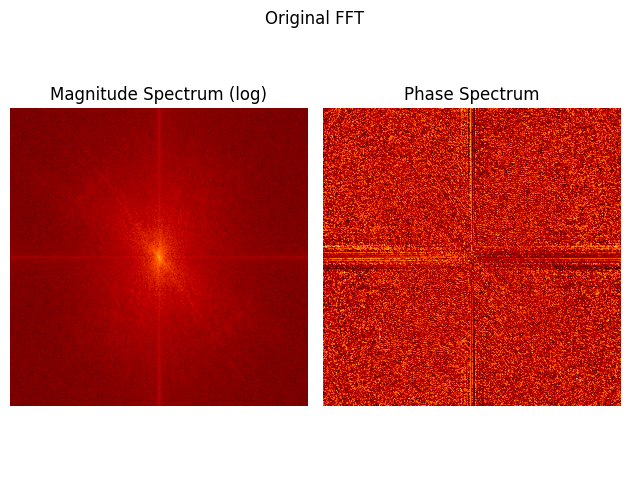

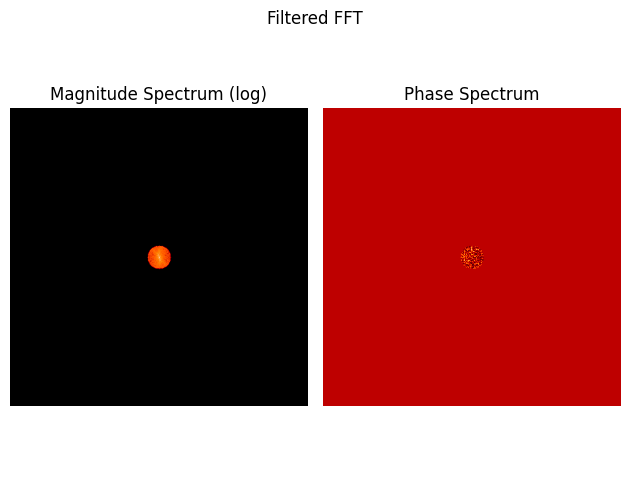

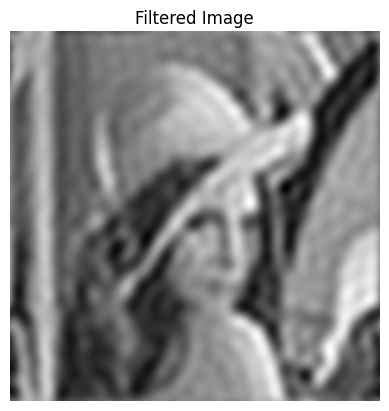

In [3]:
# Ideal LPF
filter_args = {"filepath": filepath, "cutoff": 20, "_type": "ideal", "verbose": True}
exp4.plot_filter("low", filter_args)

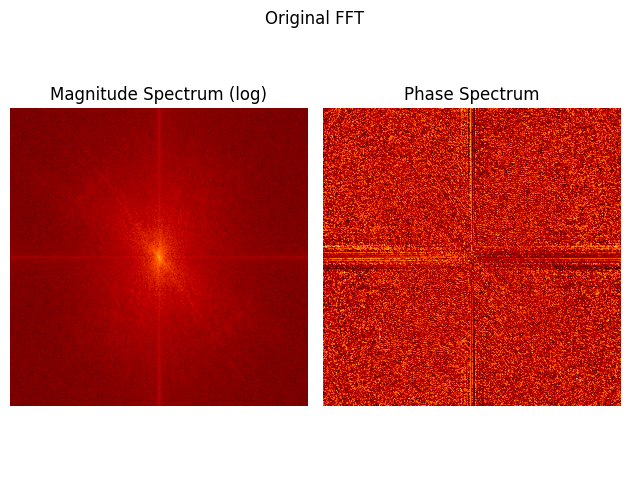

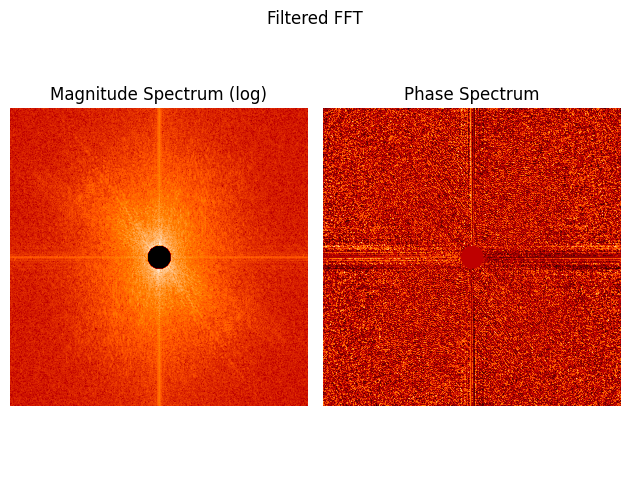

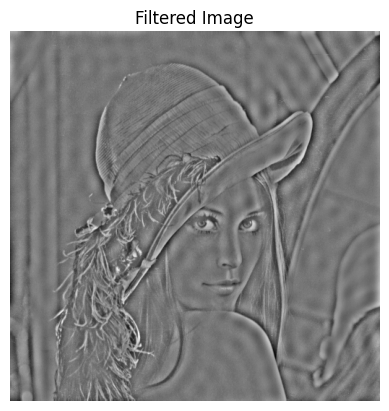

In [4]:
# Ideal HPF
filter_args = {"filepath": filepath, "cutoff": 20, "_type": "ideal", "verbose": True}
exp4.plot_filter("high", filter_args)

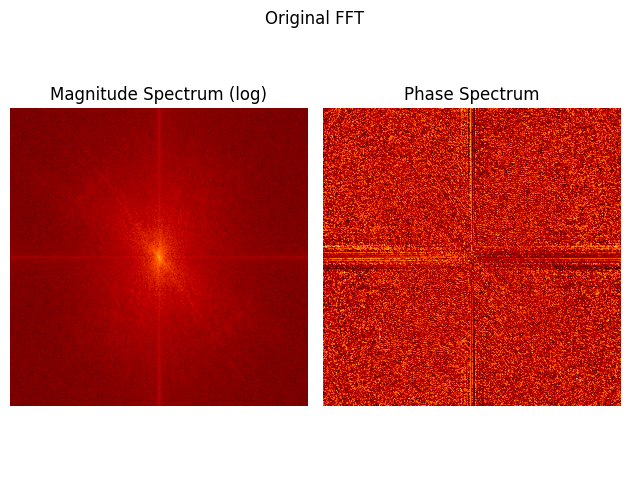

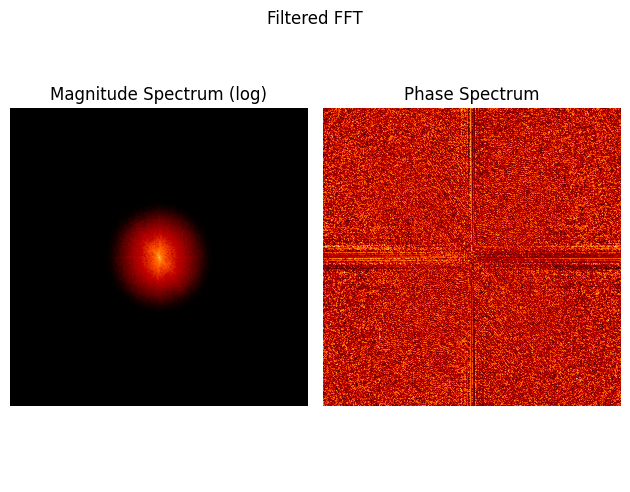

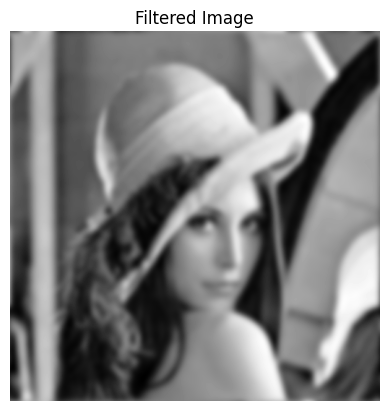

In [5]:
# Gaussian LPF
filter_args = {"filepath": filepath, "cutoff": 20, "_type": "gaussian", "verbose": True}
exp4.plot_filter("low", filter_args)

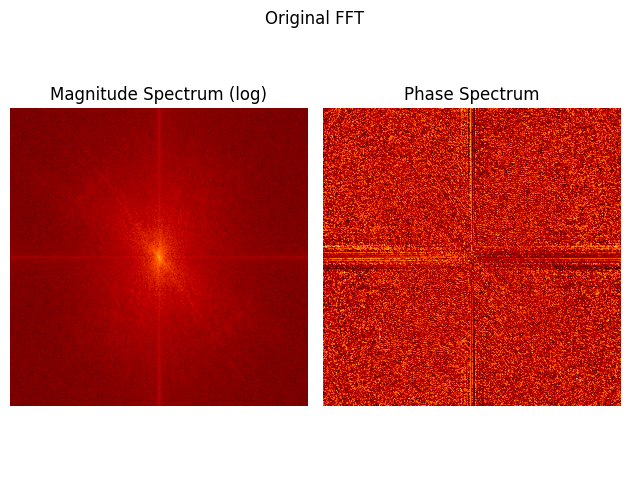

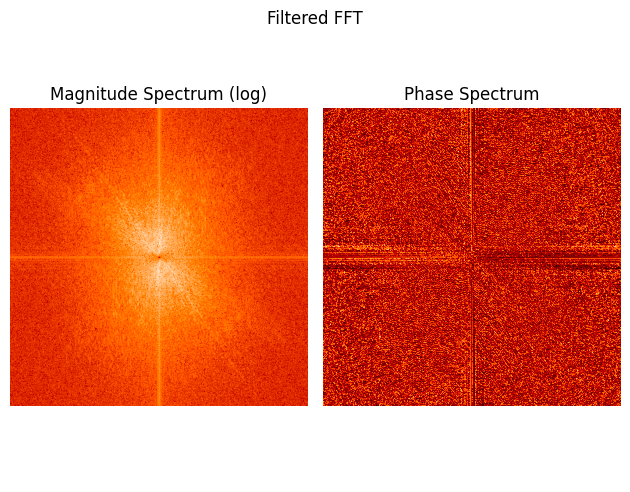

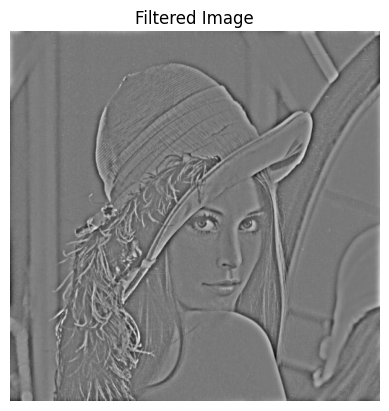

In [6]:
# Gaussian HPF
filter_args = {"filepath": filepath, "cutoff": 20, "_type": "gaussian", "verbose": True}
exp4.plot_filter("high", filter_args)

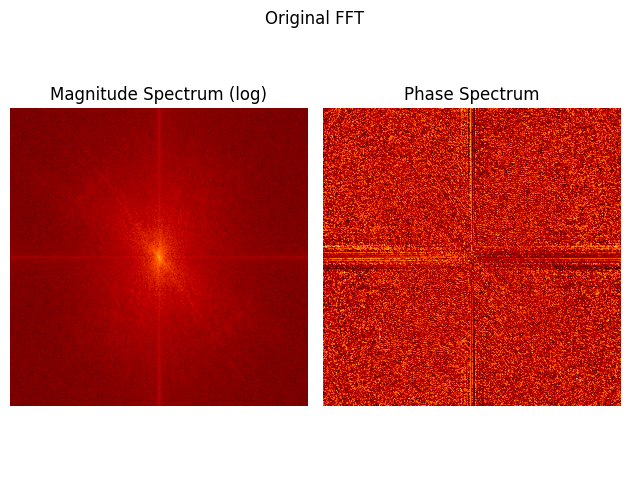

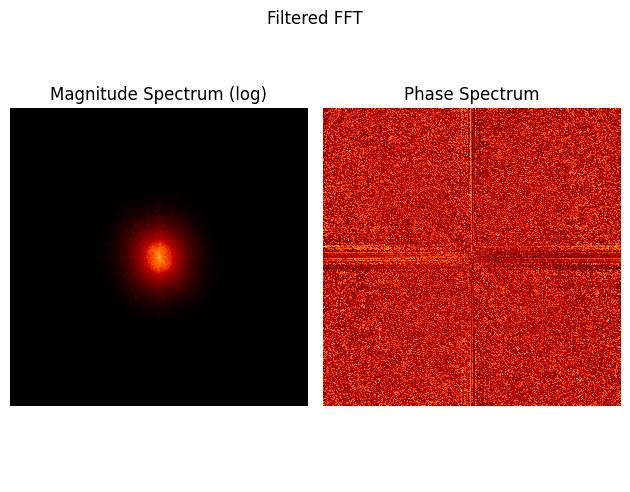

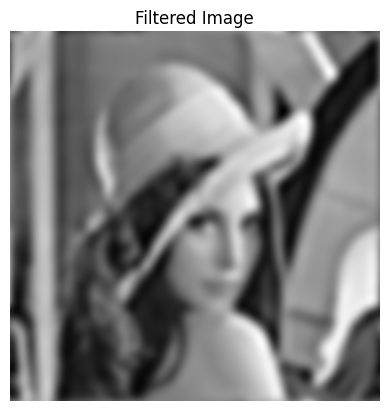

In [7]:
# Butter LPF
filter_args = {"filepath": filepath, "cutoff": 20, "_type": "butter", "verbose": True}
exp4.plot_filter("low", filter_args)

/var/folders/02/1lkcymwj2ws1mlc4pyg16vqr0000gn/T/ipykernel_53193/1178843492.py:85: RuntimeWarning: divide by zero encountered in scalar divide
  op[i][j] = fft[i][j] * 1 / (1 + (cutoff/distance)**(2 * order))


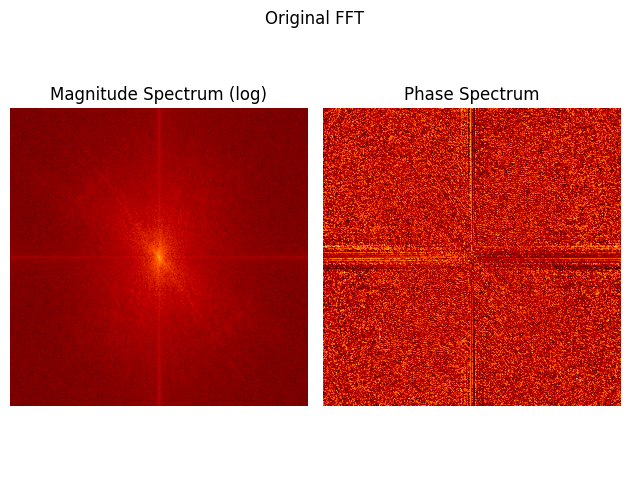

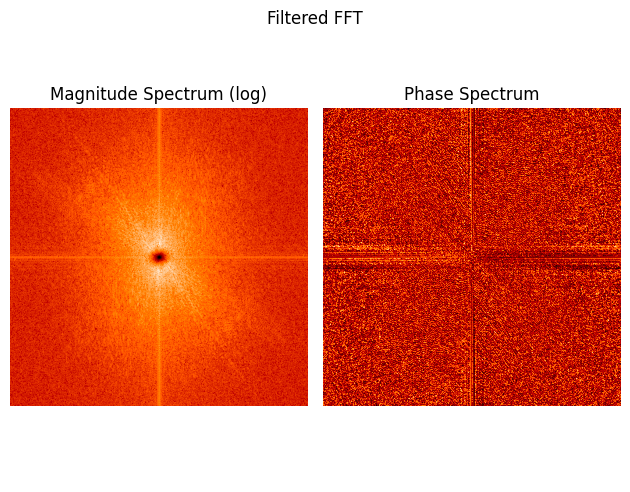

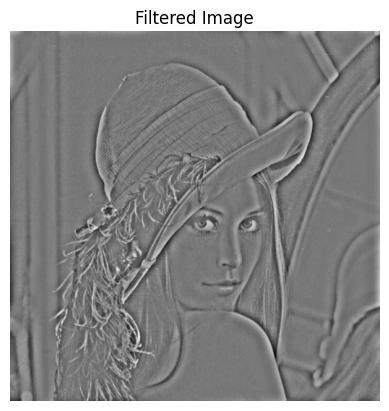

In [8]:
# Butter HPF
filter_args = {"filepath": filepath, "cutoff": 20, "_type": "butter", "verbose": True}
exp4.plot_filter("high", filter_args)

```
Q2. Read the "leopard_elephant.jpg" image. This is an example of an image illusion in which
the perception of an image changes with viewing angle, time spent viewing, or image size. A
leopard can be seen in the image if you view it at its full spatial resolution. However, if you
view the image at a lower spatial resolution, an elephant will appear. Using your frequency
domain filtering idea, can you create an identical optical illusion. Read the files "einstein.png"
and "marilyn.png." Make a hybrid image so that when viewed at a higher spatial resolution,
the illusion appears to be Einstein, and when viewed at a lower spatial resolution, it appears to
be Marilyn.
```

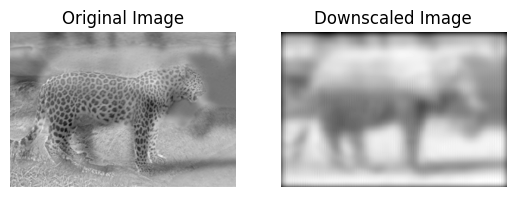

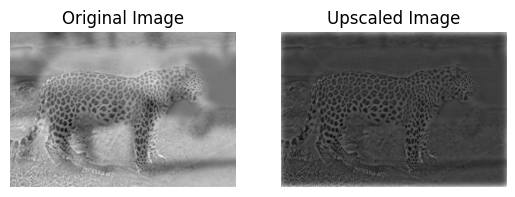

In [9]:
filepath = "images/leopard_elephant.jpg"
exp4.downscale(filepath, 2)
exp4.upscale(filepath, 2)

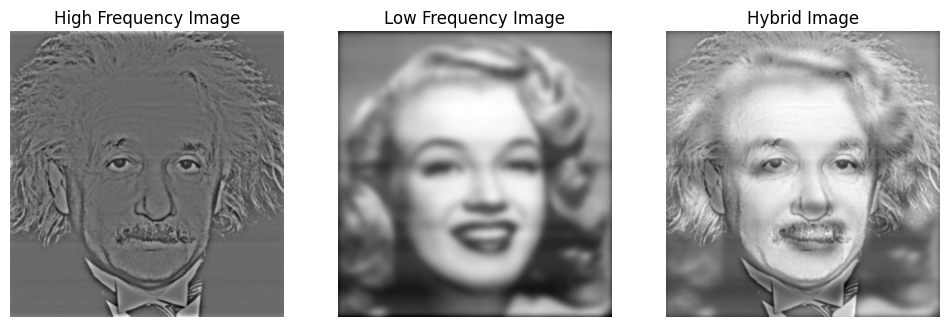

In [10]:
hybrid = exp4.hybridize_image("images/einstein.png", "images/marilyn.png", cutoff=20)

In [11]:
Image.fromarray(hybrid).convert('RGB').save("outputs/einstein_marilyn.jpg")

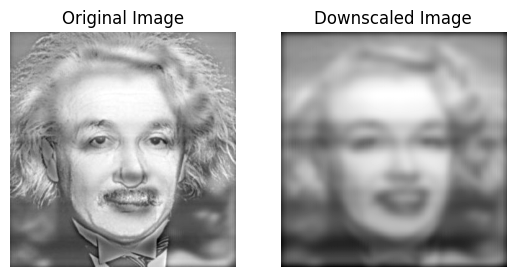

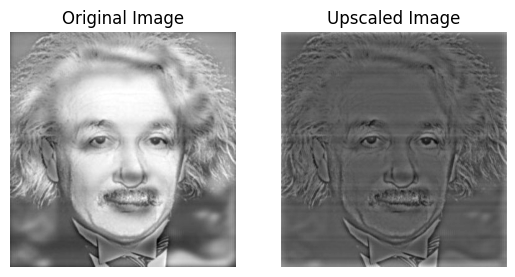

In [12]:
exp4.downscale("outputs/einstein_marilyn.jpg", 2)
exp4.upscale("outputs/einstein_marilyn.jpg", 2)

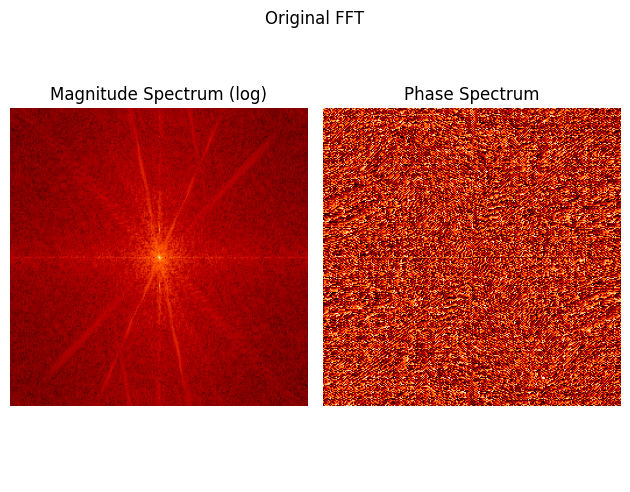

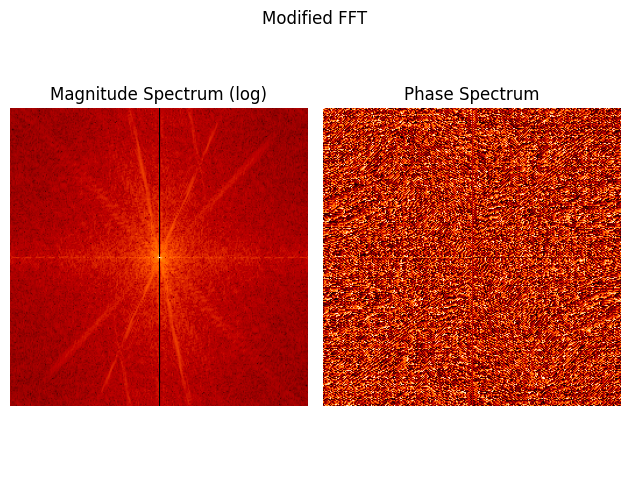

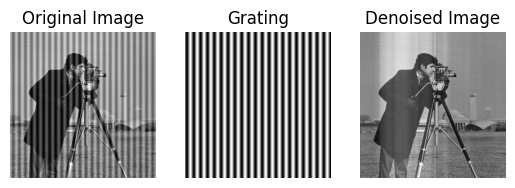

In [13]:
low_pass_args = {
    'cutoff': 0, 
    '_type': 'ideal', 
    'verbose': False
}

grating_args_straight={
    'wavelength': 12,
    'angle': 90,
    'phase': 0,
    'verbose': False
    }

grate_epsilon=10

exp4.remove_noise("images/cameraman_noisy1.jpg", low_pass_args, grating_args_straight, grate_epsilon=10)

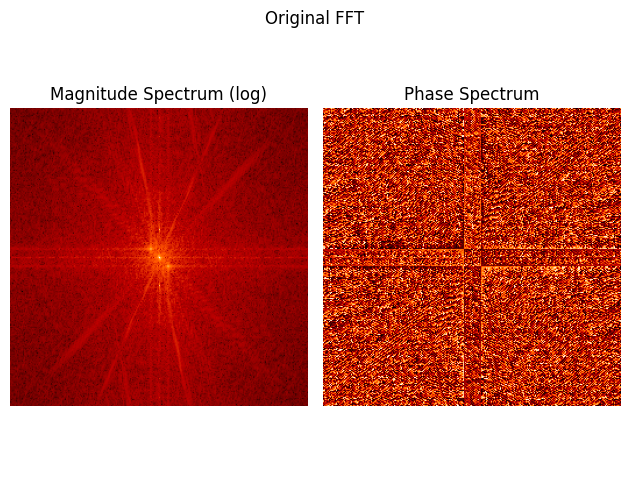

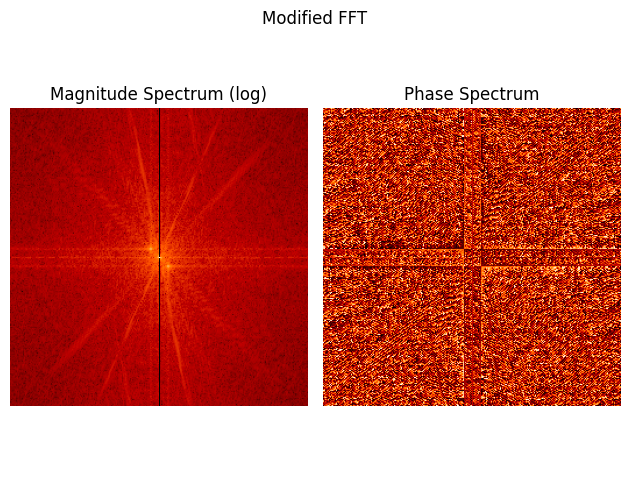

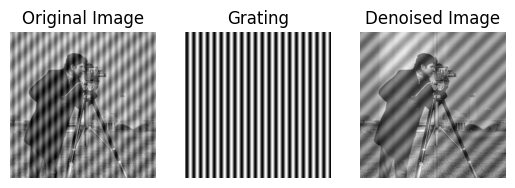

In [14]:
exp4.remove_noise("images/cameraman_noisy2.jpg", low_pass_args, grating_args_straight, grate_epsilon=10)

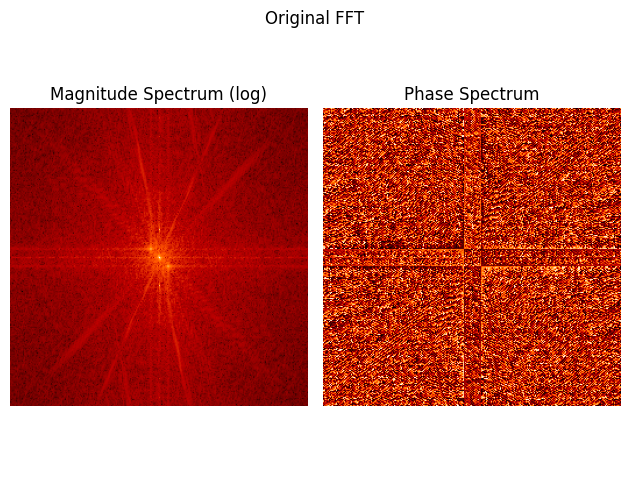

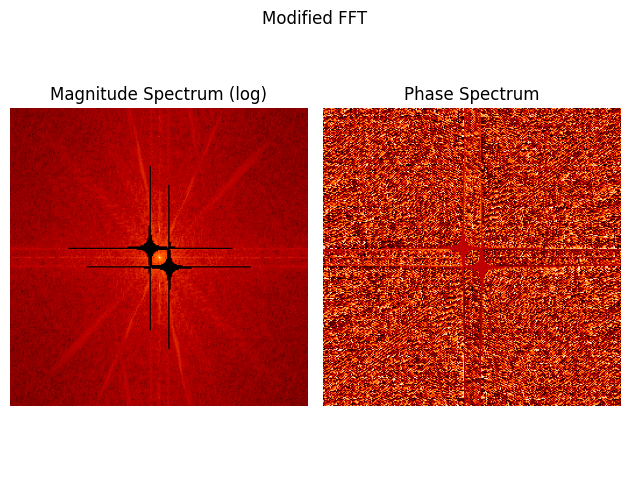

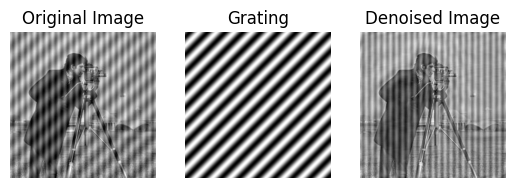

In [15]:
grating_args_diag={
    'wavelength': 22,
    'angle': 45,
    'phase': 0,
    'verbose': False
    }

exp4.remove_noise("images/cameraman_noisy2.jpg", low_pass_args, grating_args_diag, grate_epsilon=100)

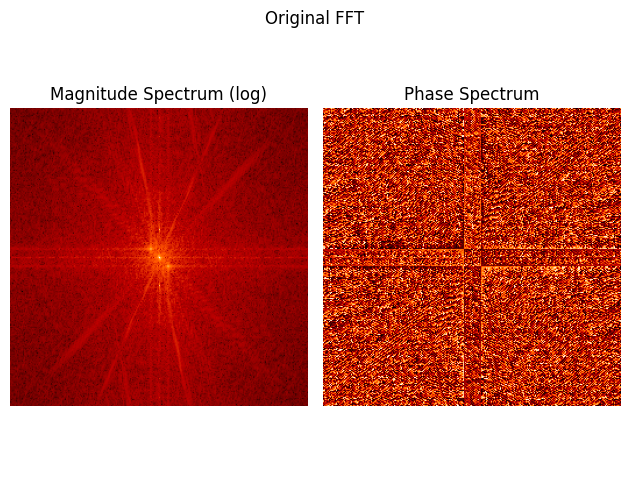

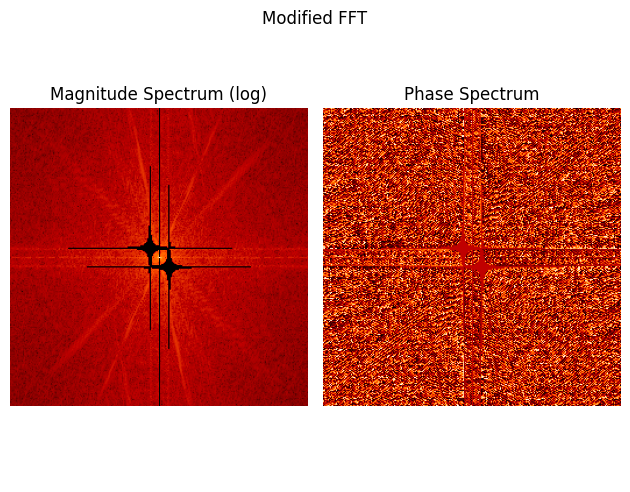

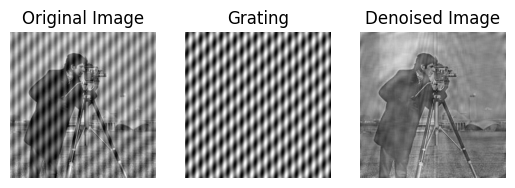

In [16]:
grating_args_both = [grating_args_diag, grating_args_straight]

exp4.remove_noise("images/cameraman_noisy2.jpg", low_pass_args, grating_args_both, grate_epsilon=100)